# Generate (overview) figures
Yogita has a list of samples she wants to show in a figure.
Let's generate them, based on the preparation work in `CheckAndPreviewScans.ipynb`

In [1]:
import platform
import os
import glob
import pandas
import imageio
import numpy
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import seaborn
import dask
import dask_image.imread
from dask.distributed import Client, LocalCluster
from numcodecs import Blosc
import skimage
from tqdm import notebook

In [2]:
# Set dask temporary folder
# Do this before creating a client: https://stackoverflow.com/a/62804525/323100
import tempfile
if 'Linux' in platform.system():
    tmp = os.path.join(os.sep, 'media', 'habi', 'Fast_SSD')
elif 'Darwin' in platform.system():
    tmp = tempfile.gettempdir()
else:
    if 'anaklin' in platform.node():
        tmp = os.path.join('F:\\')
    else:
        tmp = os.path.join('D:\\')
dask.config.set({'temporary_directory': os.path.join(tmp, 'tmp')})
print('Dask temporarry files go to %s' % dask.config.get('temporary_directory'))

Dask temporarry files go to /media/habi/Fast_SSD/tmp


In [3]:
# Start cluster and client now, after setting tempdir
cluster = LocalCluster()
client = Client(cluster)

In [4]:
print('You can seee what DASK is doing at "http://localhost:%s/status"' % client.scheduler_info()['services']['dashboard'])

You can seee what DASK is doing at "http://localhost:8787/status"


In [5]:
# # Ignore warnings in the notebook
# import warnings
# warnings.filterwarnings("ignore")

In [6]:
# Set up figure defaults
plt.rc('image', cmap='gray', interpolation='nearest')  # Display all images in b&w and with 'nearest' interpolation
plt.rcParams['figure.figsize'] = (16, 9)  # Size up figures a bit
plt.rcParams['figure.dpi'] = 200  # Size up figures a bit

In [7]:
# Setup scale bar defaults
plt.rcParams['scalebar.location'] = 'lower right'
plt.rcParams['scalebar.frameon'] = False
plt.rcParams['scalebar.color'] = 'white'

In [8]:
# Display all plots identically
lines = 2
# And then do something like
# plt.subplot(lines, numpy.ceil(len(Data) / float(lines)), c + 1)

In [9]:
# Different locations if running either on Linux or Windows
FastSSD = False
# to speed things up significantly
if 'Linux' in platform.system():
    if FastSSD:
        BasePath = os.path.join(os.sep, 'media', 'habi', 'Fast_SSD')
    else:
        BasePath = os.path.join(os.sep, 'home', 'habi', '1272')
else:
    if FastSSD:
        BasePath = os.path.join('F:\\')
    else:
        if 'anaklin' in platform.node():
            BasePath = os.path.join('S:\\')
        else:
            BasePath = os.path.join('D:\\Results')
Root = os.path.join(BasePath, 'Chondrules Space Yogita')
print('We are loading all the data from %s' % Root)

We are loading all the data from /home/habi/1272/Chondrules Space Yogita


In [10]:
def get_git_hash():
    '''
    Get the current git hash from the repository.
    Based on http://stackoverflow.com/a/949391/323100 and
    http://stackoverflow.com/a/18283905/323100
    '''
    from subprocess import Popen, PIPE
    import os
    gitprocess = Popen(['git',
                        '--git-dir',
                        os.path.join(os.getcwd(), '.git'),
                        'rev-parse',
                        '--short',
                        '--verify',
                        'HEAD'],
                       stdout=PIPE)
    (output, _) = gitprocess.communicate()
    return output.strip().decode("utf-8")

In [11]:
# # Make directory for output
OutPutDir = os.path.join(os.getcwd(), 'Output', get_git_hash())
print('We are saving all the output to %s' % OutPutDir)
os.makedirs(OutPutDir, exist_ok=True)

We are saving all the output to /home/habi/P/Documents/ChondrulesSpaceYogita/Output/ef4c267


In [12]:
def get_pixelsize(logfile):
    """Get the pixel size from the scan log file"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Image Pixel' in line and 'Scaled' not in line:
                pixelsize = float(line.split('=')[1])
    return(pixelsize)

In [13]:
# Make us a dataframe for saving all that we need
Data = pandas.DataFrame()

In [14]:
# Get *all* projection log files
Data['LogFile'] = [f for f in sorted(glob.glob(os.path.join(Root, '**', '*.log'), recursive=True))]

In [217]:
# Drop contrast phantoms and those currently scanning (e.g. not moved from SampleChanger directory)
for c, sample in Data.iterrows():
    if 'ContrastPhantoms' in sample.LogFile:
        Data.drop(c, inplace=True)
        # print(c, sample.LogFile)
    elif 'SampleChanger' in sample.LogFile:
        Data.drop(c, inplace=True)
    elif 'ulk' in sample.LogFile:
        Data.drop(c, inplace=True)        
    elif 'rectmp' in sample.LogFile:
        Data.drop(c, inplace=True)
Data.reset_index(drop=True, inplace=True)

In [16]:
# Get all folders
Data['Folder'] = [os.path.dirname(f) for f in Data['LogFile']]

In [17]:
# Get the necessary information
Data['Sample'] = [(f[len(Root)+1:]).split(os.sep)[0] for f in Data['Folder']]
Data['Scan'] = [(f[len(Root)+1:]).split(os.sep)[1] for f in Data['Folder']]

In [18]:
# Get the file names of the reconstructions
Data['Reconstructions'] = [sorted(glob.glob(os.path.join(os.path.dirname(lf),
                                                         '*.png'))) for lf in Data['LogFile']]
Data['Number of reconstructions'] = [len(r) for r in Data.Reconstructions]

In [19]:
Data[['Sample', 'Scan','Number of reconstructions']]

,Sample,Scan,Number of reconstructions
0,All-200813,proj,0
1,All-200813,proj,0
2,All-200813,rec_bottom,551
3,All-200813,rec_middle,1008
4,All-200813,rec_top,698
...,...,...,...
208,SA_Jan,proj,0
209,SA_Jan,proj,0
210,SA_Jan,proj,0
211,SA_Jan,rec,1241


In [20]:
# Check for samples which are not yet reconstructed
for c, row in Data.iterrows():
    # Iterate over every 'proj' folder
    if 'proj' in row.Folder:
        if not 'TScopy' in row.Folder and not 'PR' in row.Folder:
            # If there's nothing with 'rec*' on the same level, then tell us        
            if not glob.glob(row.Folder.replace('proj', '*rec*')):
                print('- %s is missing matching reconstructions' % row.LogFile[len(Root)+1:])

In [21]:
# Drop 'proj' folders and samples which have not been reconstructed yet
# Based on https://stackoverflow.com/a/13851602
for c, sample in Data[Data['Number of reconstructions'] == 0].iterrows():
    if not 'proj' in sample.LogFile:
        print('%s is empty' % os.path.dirname(sample.LogFile))
Data = Data[Data['Number of reconstructions'] > 0]
Data.reset_index(drop=True, inplace=True)
print('We have %s folders with reconstructions' % (len(Data)))

We have 132 folders with reconstructions


In [218]:
print('We have %s log files to work with' % len(Data))

We have 129 log files to work with


In [219]:
# Get parameters to doublecheck from logfiles
Data['Voxelsize'] = [get_pixelsize(log) for log in Data['LogFile']]

In [220]:
# Check for reconstructions
for c, row in Data.iterrows():
    if not len(glob.glob(os.path.join(os.path.dirname(row.LogFile), '*.png'))):
        print('%s is missing reconstructions' % row.Folder)

In [221]:
# Load all reconstructions into ephemereal DASK arrays
Reconstructions = [None] * len(Data)
for c, row in notebook.tqdm(Data.iterrows(), desc='Ingest reconstructions', total=len(Data)):
    Reconstructions[c] = dask_image.imread.imread(os.path.join(row['Folder'], '*rec*.png'))

In [222]:
# The three cardinal directions
directions = ['Axial', 'Sagittal', 'Coronal']

In [223]:
# How big are the datasets?
Data['Size'] = [rec.shape for rec in Reconstructions]

In [224]:
# Read or calculate the directional MIPs, put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['MIP_' + direction] = [None] * len(Reconstructions)
for c, row in notebook.tqdm(Data.iterrows(), desc='MIPs', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(os.path.dirname(row['Folder']), '%s.%s.MIP.%s.png' % (row['Sample'],
                                                                                         row['Scan'],
                                                                                         direction))
        if os.path.exists(outfilepath):
            Data.at[c,'MIP_' + direction] = dask_image.imread.imread(outfilepath)
        else:
            # Generate MIP
            Data.at[c,'MIP_' + direction] = Reconstructions[c].max(axis=d).compute()
            # Save it out
            imageio.imwrite(outfilepath, Data.at[c,'MIP_' + direction].astype('uint8'))

In [225]:
# Show directional MIP slices
for c, row in Data.iterrows():
    outputfile = os.path.join(os.path.dirname(row['Folder']), '%s.%s.MIPs.png' % (row['Sample'], row['Scan']))
    if not os.path.exists(outputfile):
        for d, direction in enumerate(directions):
            plt.subplot(1, 3, d + 1)
            plt.imshow(row['MIP_' + direction])
            plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
            if row['Scan']:
                plt.title('%s, %s' % (os.path.join(row['Sample'], row['Scan']),
                                      direction + ' MIP'))
            else:
                plt.title('%s, %s' % (row['Sample'],
                                      direction + ' MIP'))
            plt.axis('off')

        plt.savefig(outputfile,
                    transparent=False,
                    bbox_inches='tight')
        plt.show()

In [226]:
# Read or calculate the middle slices, put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['Mid_' + direction] = [None] * len(Reconstructions)
for c, row in notebook.tqdm(Data.iterrows(), desc='Middle images', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(os.path.dirname(row['Folder']), '%s.%s.Middle.%s.png' % (row['Sample'],
                                                                                            row['Scan'],
                                                                                            direction))
        if os.path.exists(outfilepath):
            Data.at[c,'Mid_' + direction] = dask_image.imread.imread(outfilepath)
        else:
            # Generate requested axial view
            if 'Axial' in direction:
                Data.at[c,'Mid_' + direction] = Reconstructions[c][Data['Size'][c][0]//2].compute()
            if 'Sagittal' in direction:
                Data.at[c,'Mid_' + direction] = Reconstructions[c][:,Data['Size'][c][1]//2,:].compute()
            if 'Coronal' in direction:
                Data.at[c,'Mid_' + direction] = Reconstructions[c][:,:,Data['Size'][c][2]//2].compute()
            # Save the calculated 'direction' view to disk
            imageio.imwrite(outfilepath, (Data.at[c,'Mid_' + direction]))

In [227]:
# Show directional middle slices
for c, row in Data.iterrows():
    outputfile = os.path.join(os.path.dirname(row['Folder']), '%s.%s.MiddleSlices.png' % (row['Sample'], row['Scan']))
    if not os.path.exists(outputfile):
        for d, direction in enumerate(directions):
            plt.subplot(1, 3, d + 1)
            plt.imshow(row['Mid_' + direction])
            plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
            plt.title('%s, %s, %s' % (row['Sample'],
                                      os.path.basename(row['Folder']),
                                      direction + ' Middle slice'))
            plt.axis('off')
        plt.savefig(outputfile,
                    transparent=True,
                    bbox_inches='tight')
        plt.show()

In [228]:
# Generate figure for each unique sample name
SampleNames = Data['Sample'].unique()

In [229]:
# Let's take the easy ones first
SampleNamesSelector = ['Qing', 'NWA112', 'NWA126', 'NWA5', 'NIN', 'NWA18', 'NWA82', 'CK', 'CHW']

In [230]:
for selector in SampleNamesSelector:
    for smpl in SampleNames:
        if smpl.startswith(selector):
            print(smpl)
    print(80*'-')

Qing1
Qing2
Qing3
Qing4
Qing5
--------------------------------------------------------------------------------
NWA11241A
NWA11241B
NWA11241C
NWA11241D
--------------------------------------------------------------------------------
NWA12692A
NWA12692B
NWA12692C
NWA12692D
--------------------------------------------------------------------------------
NWA507A
NWA507A_norandom
NWA507B
NWA507B_norandom
--------------------------------------------------------------------------------
NINQ
NINQ2
NINQ3
--------------------------------------------------------------------------------
NWA1892A
NWA1892B
NWA1892C
--------------------------------------------------------------------------------
NWA8276A
NWA8276B
NWA8276C
NWA8276D
NWA8276E
--------------------------------------------------------------------------------
CK3A
CK3B
CK3B_dithered
CK3C
CK3D
--------------------------------------------------------------------------------
CHWA
CHWA2
CHWB
CHWB2
CHWC
CHWC2
CHWD
CHWE
CHWF
CHWG
----------------

In [231]:
# Select *one* kind of sample
# https://stackoverflow.com/a/49478156/323100
qing = Data[Data['Sample'].str.startswith('Qing')]
qing.reset_index(inplace=True, drop=True)
qing[['Sample', 'Scan']]
qing.name='qing'

In [232]:
# Display all plots identically
lines = 2
# And then do something like
# plt.subplot(lines, int(numpy.ceil(len(Data) / float(lines))), c + 1)

In [233]:
# # Show requested middle slices
# direction = 'Axial'
# # outputfile = os.path.join(os.path.dirname(row['Folder']), '%s.%s.MiddleSlices.png' % (row['Sample'], row['Scan']))
# for c, row in QingSelected.iterrows():
#     plt.subplot(lines, int(numpy.ceil(len(qing) / float(lines))), c + 1)
#     # For 'squeeze' see https://github.com/dask/dask-image/issues/239
#     plt.imshow(
#         skimage.exposure.adjust_log(row['Mid_' + direction].squeeze().compute(),
#                                     gain=2))
#     plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
#     plt.title('%s\n%s\n%s' % (row['Sample'],
#                               os.path.basename(row['Folder']),
#                               direction + ' Middle slice'))
#     plt.axis('off')
#     plt.savefig(os.path.join(OutPutDir, 'qing.png'),
#                 transparent=True,
#                 bbox_inches='tight')
# plt.show()

In [234]:
def figure(samplename, direction='Axial', which='Mid', gain=2, title=True, adapt='log'):
    '''
    Generate the figure for the selected sample name (startswith)
    '''
    for c, row in samplename.iterrows():
        plt.subplot(lines, int(numpy.ceil(len(samplename) / float(lines))), c + 1)
        # Push contrast with exposure.adjust_log
        # For 'squeeze' see https://github.com/dask/dask-image/issues/239
        if not adapt:
            img = row[which + '_' + direction].squeeze()       
        elif 'log' in adapt:
            img = skimage.exposure.adjust_log(row[which + '_' + direction].squeeze(), gain=gain)
        elif 'equalize' in adapt:
            img = skimage.exposure.equalize_adapthist(row[which + '_' + direction].squeeze()                                                     )
        plt.imshow(img)
        plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
        if title:
            plt.title('%s\n%s\n%s' % (row['Sample'],
                                      os.path.basename(row['Folder']),
                                      direction + which + 'slice'))
        plt.axis('off')
    filename = samplename.name
    if title:
        filename += '.title'
    if adapt:
        filename += '.%s' % adapt
        if 'log' in adapt:
            filename += '_gain%s' % gain
    print(filename)
    plt.savefig(os.path.join(OutPutDir, '%s.png' % filename),
                    transparent=True,
                    bbox_inches='tight')
    plt.show()    
    return()

qing.title.equalize


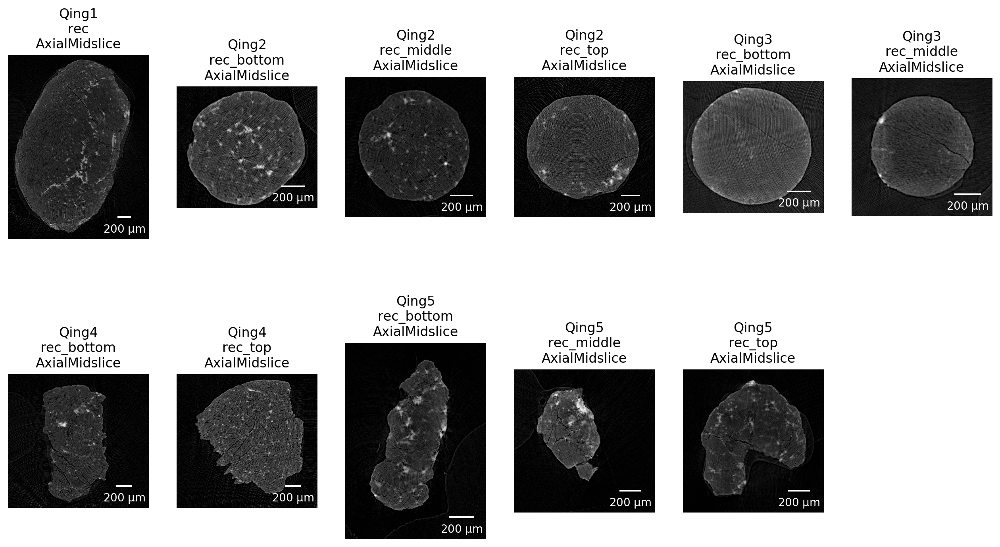

()

In [235]:
figure(qing, which='Mid', title=True, adapt='equalize')

In [236]:
Data['FolderTrunc'] = [folder[len(Root):] for folder in Data['Folder']]

   Sample        Scan        FolderTrunc
0   Qing1         rec         /Qing1/rec
1   Qing2  rec_bottom  /Qing2/rec_bottom
2   Qing2  rec_middle  /Qing2/rec_middle
3   Qing2     rec_top     /Qing2/rec_top
4   Qing3  rec_bottom  /Qing3/rec_bottom
5   Qing3  rec_middle  /Qing3/rec_middle
6   Qing4  rec_bottom  /Qing4/rec_bottom
7   Qing4     rec_top     /Qing4/rec_top
8   Qing5  rec_bottom  /Qing5/rec_bottom
9   Qing5  rec_middle  /Qing5/rec_middle
10  Qing5     rec_top     /Qing5/rec_top
Qing.title


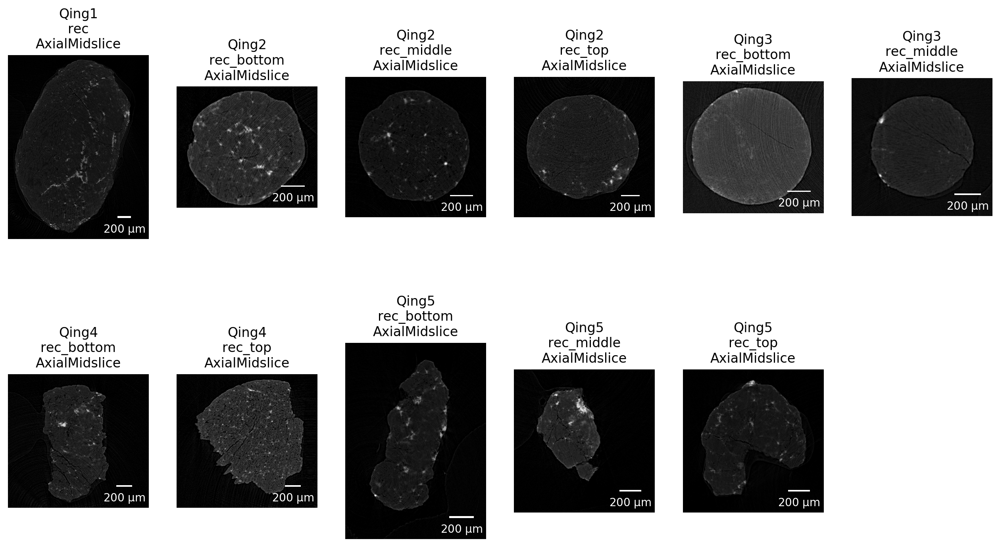

      Sample        Scan            FolderTrunc
0  NWA11241A  rec_bottom  /NWA11241A/rec_bottom
1  NWA11241A     rec_top     /NWA11241A/rec_top
2  NWA11241B  rec_bottom  /NWA11241B/rec_bottom
3  NWA11241B  rec_middle  /NWA11241B/rec_middle
4  NWA11241B     rec_top     /NWA11241B/rec_top
5  NWA11241C  rec_bottom  /NWA11241C/rec_bottom
6  NWA11241C     rec_top     /NWA11241C/rec_top
7  NWA11241D  rec_bottom  /NWA11241D/rec_bottom
8  NWA11241D    rec_high    /NWA11241D/rec_high
9  NWA11241D     rec_low     /NWA11241D/rec_low
NWA112.title


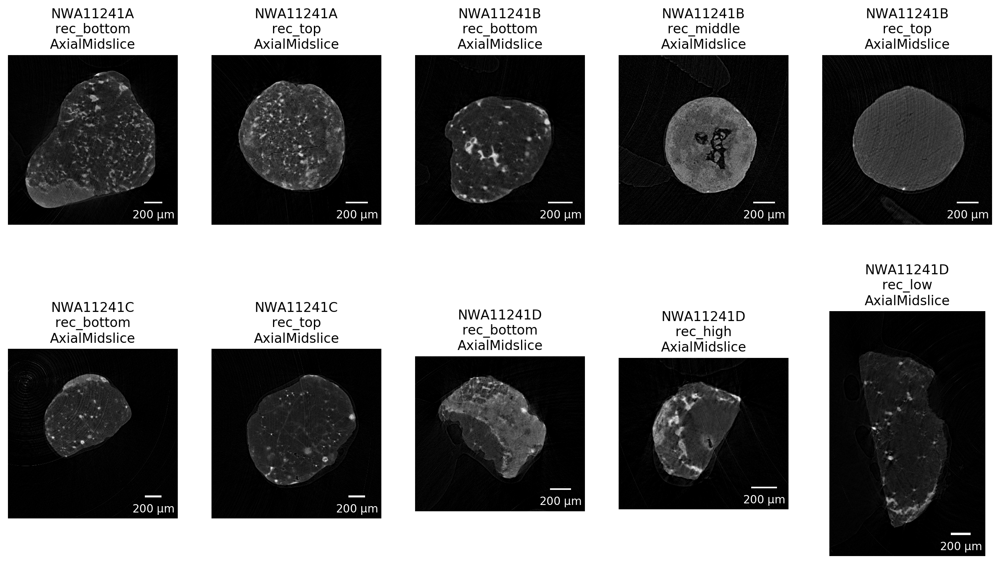

      Sample        Scan            FolderTrunc
0  NWA12692A  rec_bottom  /NWA12692A/rec_bottom
1  NWA12692A     rec_top     /NWA12692A/rec_top
2  NWA12692B  rec_bottom  /NWA12692B/rec_bottom
3  NWA12692B     rec_top     /NWA12692B/rec_top
4  NWA12692C  rec_bottom  /NWA12692C/rec_bottom
5  NWA12692C     rec_top     /NWA12692C/rec_top
6  NWA12692D  rec_bottom  /NWA12692D/rec_bottom
7  NWA12692D     rec_top     /NWA12692D/rec_top
NWA126.title


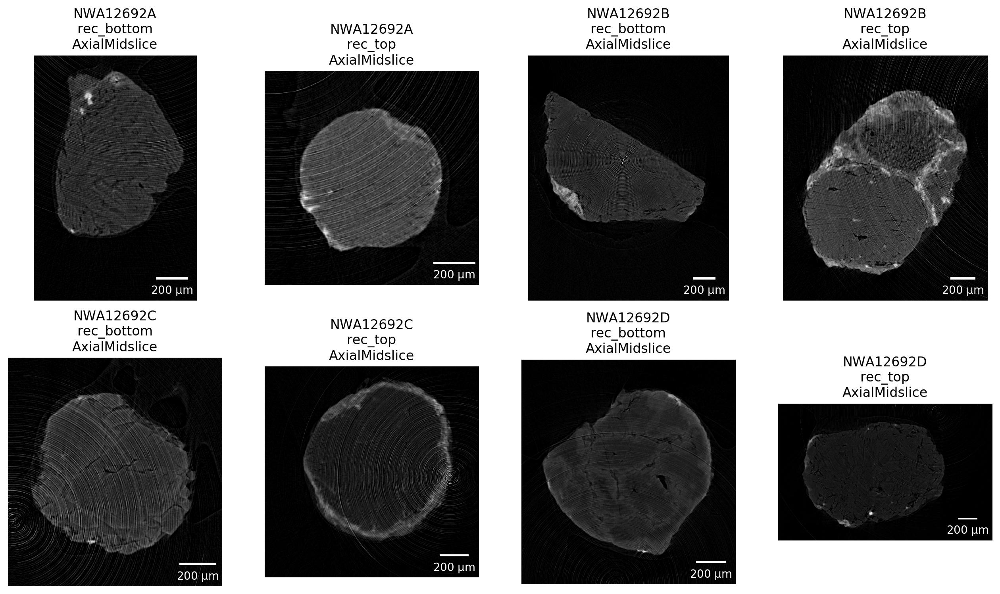

              Sample        Scan                   FolderTrunc
0            NWA507A  rec_bottom           /NWA507A/rec_bottom
1            NWA507A    rec_high             /NWA507A/rec_high
2   NWA507A_norandom  rec_bottom  /NWA507A_norandom/rec_bottom
3   NWA507A_norandom    rec_high    /NWA507A_norandom/rec_high
4   NWA507A_norandom     rec_top     /NWA507A_norandom/rec_top
5            NWA507B  rec_bottom           /NWA507B/rec_bottom
6            NWA507B    rec_high             /NWA507B/rec_high
7            NWA507B     rec_low              /NWA507B/rec_low
8            NWA507B     rec_mid              /NWA507B/rec_mid
9            NWA507B     rec_top              /NWA507B/rec_top
10  NWA507B_norandom  rec_bottom  /NWA507B_norandom/rec_bottom
11  NWA507B_norandom     rec_low     /NWA507B_norandom/rec_low
12  NWA507B_norandom  rec_middle  /NWA507B_norandom/rec_middle
13  NWA507B_norandom     rec_top     /NWA507B_norandom/rec_top
NWA5.title


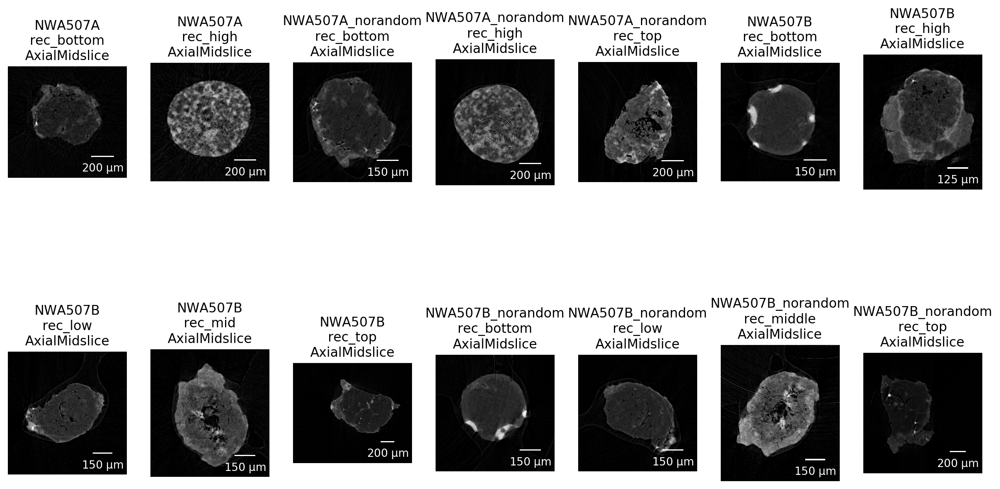

  Sample        Scan        FolderTrunc
0   NINQ  rec_bottom   /NINQ/rec_bottom
1   NINQ  rec_middle   /NINQ/rec_middle
2   NINQ     rec_top      /NINQ/rec_top
3  NINQ2  rec_bottom  /NINQ2/rec_bottom
4  NINQ2     rec_top     /NINQ2/rec_top
5  NINQ3         rec         /NINQ3/rec
NIN.title


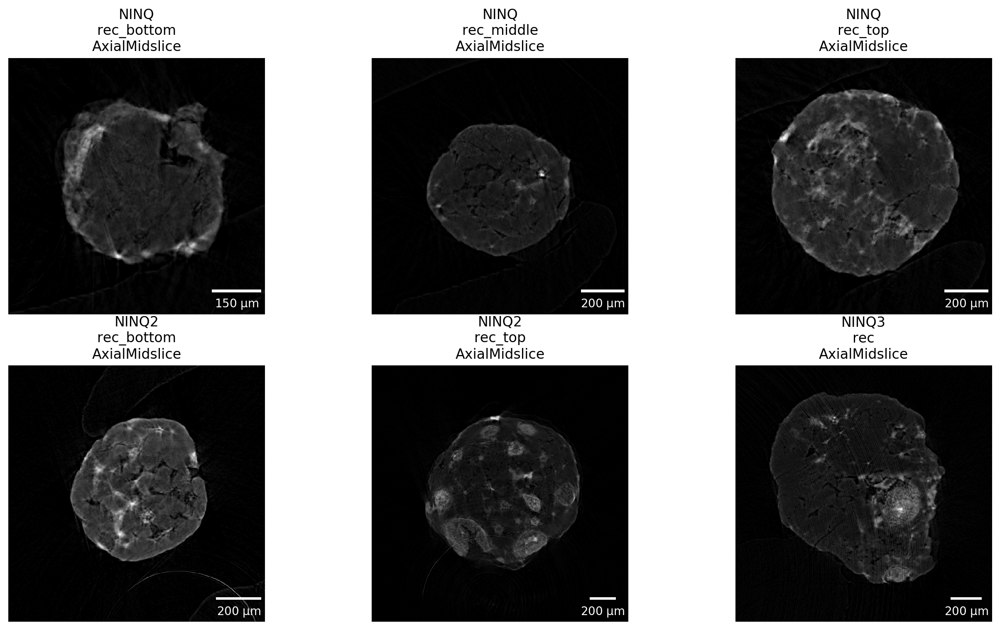

     Sample        Scan           FolderTrunc
0  NWA1892A  rec_bottom  /NWA1892A/rec_bottom
1  NWA1892A     rec_top     /NWA1892A/rec_top
2  NWA1892B  rec_bottom  /NWA1892B/rec_bottom
3  NWA1892B     rec_mid     /NWA1892B/rec_mid
4  NWA1892B     rec_top     /NWA1892B/rec_top
5  NWA1892C  rec_bottom  /NWA1892C/rec_bottom
6  NWA1892C     rec_mid     /NWA1892C/rec_mid
7  NWA1892C     rec_top     /NWA1892C/rec_top
NWA18.title


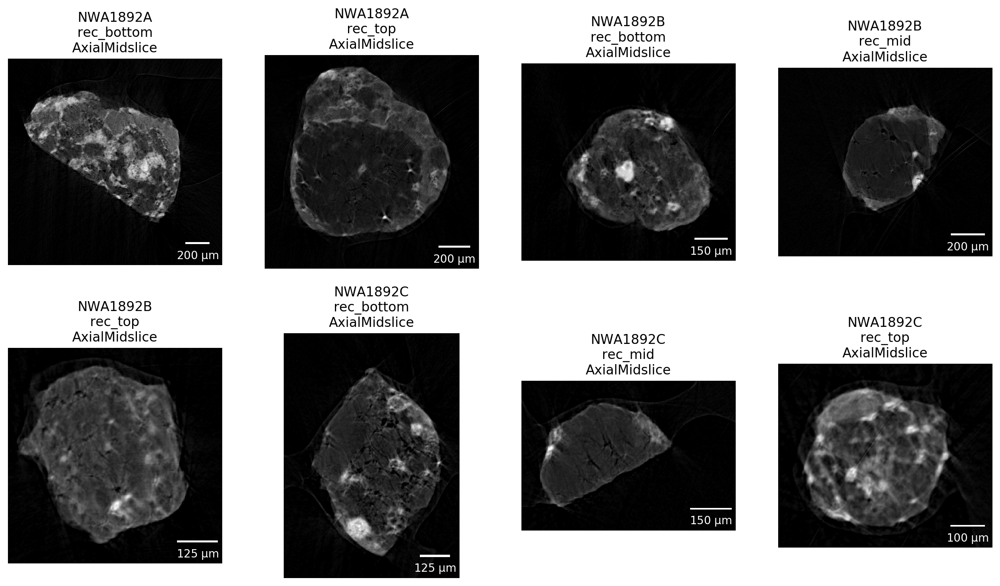

      Sample          Scan             FolderTrunc
0   NWA8276A     rec_1_top     /NWA8276A/rec_1_top
1   NWA8276A         rec_2         /NWA8276A/rec_2
2   NWA8276A         rec_3         /NWA8276A/rec_3
3   NWA8276A  rec_4_bottom  /NWA8276A/rec_4_bottom
4   NWA8276B    rec_bottom    /NWA8276B/rec_bottom
5   NWA8276B       rec_top       /NWA8276B/rec_top
6   NWA8276C    rec_bottom    /NWA8276C/rec_bottom
7   NWA8276C    rec_middle    /NWA8276C/rec_middle
8   NWA8276C       rec_top       /NWA8276C/rec_top
9   NWA8276D    rec_bottom    /NWA8276D/rec_bottom
10  NWA8276D       rec_top       /NWA8276D/rec_top
11  NWA8276E    rec_bottom    /NWA8276E/rec_bottom
NWA82.title


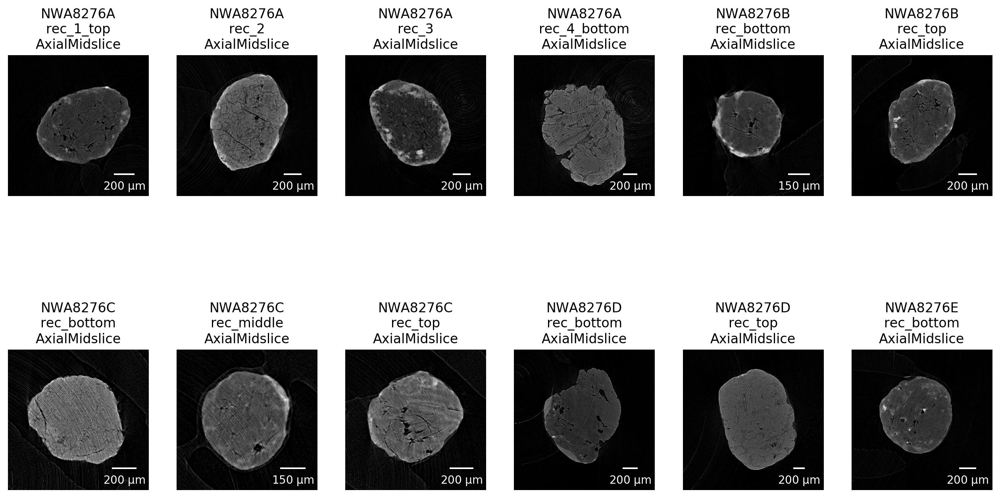

           Sample             Scan                FolderTrunc
0            CK3A       rec_bottom           /CK3A/rec_bottom
1            CK3A       rec_middle           /CK3A/rec_middle
2            CK3A          rec_top              /CK3A/rec_top
3            CK3B       rec_bottom           /CK3B/rec_bottom
4            CK3B  rec_bottom_crop      /CK3B/rec_bottom_crop
5            CK3B       rec_middle           /CK3B/rec_middle
6            CK3B  rec_middle_crop      /CK3B/rec_middle_crop
7            CK3B          rec_top              /CK3B/rec_top
8            CK3B     rec_top_crop         /CK3B/rec_top_crop
9   CK3B_dithered       rec_bottom  /CK3B_dithered/rec_bottom
10  CK3B_dithered       rec_middle  /CK3B_dithered/rec_middle
11  CK3B_dithered          rec_top     /CK3B_dithered/rec_top
12           CK3C         rec_high             /CK3C/rec_high
13           CK3C      rec_highest          /CK3C/rec_highest
14           CK3C          rec_low              /CK3C/rec_low
15      

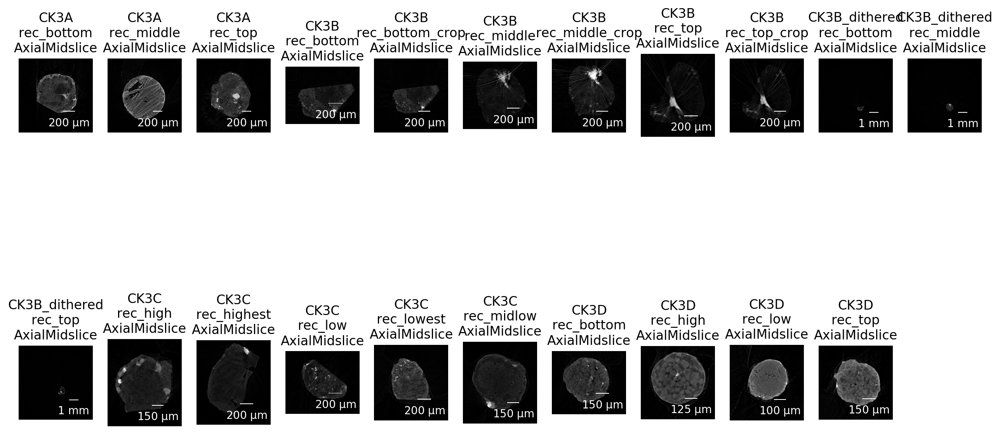

   Sample        Scan        FolderTrunc
0    CHWA         rec          /CHWA/rec
1   CHWA2         rec         /CHWA2/rec
2    CHWB  rec_bottom   /CHWB/rec_bottom
3    CHWB     rec_top      /CHWB/rec_top
4   CHWB2  rec_bottom  /CHWB2/rec_bottom
5    CHWC  rec_bottom   /CHWC/rec_bottom
6    CHWC  rec_middle   /CHWC/rec_middle
7    CHWC     rec_top      /CHWC/rec_top
8   CHWC2  rec_bottom  /CHWC2/rec_bottom
9   CHWC2  rec_middle  /CHWC2/rec_middle
10   CHWD  rec_bottom   /CHWD/rec_bottom
11   CHWD  rec_middle   /CHWD/rec_middle
12   CHWD     rec_top      /CHWD/rec_top
13   CHWE  rec_bottom   /CHWE/rec_bottom
14   CHWE  rec_middle   /CHWE/rec_middle
15   CHWE     rec_top      /CHWE/rec_top
16   CHWF  rec_bottom   /CHWF/rec_bottom
17   CHWF  rec_middle   /CHWF/rec_middle
18   CHWF     rec_top      /CHWF/rec_top
19   CHWG  rec_bottom   /CHWG/rec_bottom
20   CHWG     rec_top      /CHWG/rec_top
CHW.title


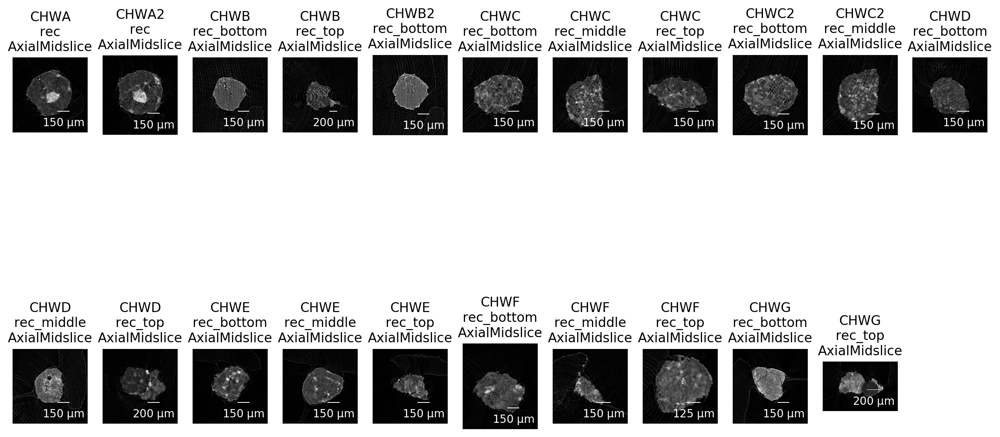

In [237]:
for c, smpl in notebook.tqdm(enumerate(SampleNamesSelector),
                            total=len(SampleNamesSelector)):   
    selected = Data[Data['Sample'].str.startswith(smpl)]
    selected.reset_index(inplace=True, drop=True)
    selected.name=smpl
    print(selected[['Sample', 'Scan', 'FolderTrunc']])
    figure(selected, title=True, adapt=None)
#     figure(selected, title=False, adapt=None)
#     figure(selected, title=True, adapt='equalize')
#     figure(selected, title=False, adapt='equalize')

In [98]:
print('Saved everything to %s' % OutPutDir)

Saved everything to P:\Documents\ChondrulesSpaceYogita\Output\ef4c267
